<font color=purple > _**Emily Nordhoff - 2022**_ </font>

# Presentation Prep

This script contains subsetting, clustering analysis, and correlation heatmaps for a project about hits in the MLB. Data was gathered from BaseballSavant.mlb.com from the 2021 season. It includes all batted balls in play in the whole season.

### Contents

    1. Importing data and libraries
    2. Subset and prep data
    3. Clustering algorithm
        3.1 Scaling
        3.2 Elbow technique
        3.3 K-means clustering
    4. Downcast data types and save
    5. Correlation heatmaps
    6. Save

## 1. Importing data and libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
import os
import sklearn
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

In [2]:
path = r'/Users/Emily/Documents/CF Data Analysis Program/Immersion 6/Hits Analysis/'

In [3]:
df = pd.read_csv(os.path.join(path,'02 data','prepared data','bip_ballparks_merged.csv'))

In [4]:
df.head()

,Unnamed: 0.1,Unnamed: 0,pitch_type,game_date,release_speed,release_pos_x,release_pos_z,player_name,batter,pitcher,...,park_location,park_surface,home_team_name,batter_team,batter_home_away,contact,runner_1b,runner_2b,runner_3b,scoring_play
0,0,0,FC,2021-04-30,82.7,3.07,4.86,"Altuve, Jose",514888,642232,...,"St. Petersburg, Florida",Artificial turf,Tampa Bay Rays,HOU,away,Under,NaN,NaN,NaN,False
1,1,1,FC,2021-04-30,82.4,3.09,4.80,"Maldonado, Martín",455117,642232,...,"St. Petersburg, Florida",Artificial turf,Tampa Bay Rays,HOU,away,Flare/Burner,NaN,NaN,NaN,False
2,2,2,CH,2021-04-30,83.8,-1.49,5.27,"Kiermaier, Kevin",595281,621121,...,"St. Petersburg, Florida",Artificial turf,Tampa Bay Rays,TB,home,Under,NaN,NaN,NaN,False
3,3,3,KC,2021-04-30,83.8,-1.07,5.49,"Madrigal, Nick",663611,669456,...,"Chicago, Illinois",Grass,Chicago White Sox,CWS,home,Topped,1.0,NaN,NaN,False
4,4,4,FF,2021-04-30,89.4,-2.60,6.15,"Reynolds, Bryan",668804,607231,...,"Pittsburgh, Pennsylvania",Grass,Pittsburgh Pirates,PIT,home,Under,NaN,1.0,NaN,False


In [5]:
df.reset_index(inplace=True)
df.rename(columns={'index':'id'}, inplace=True)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 121707 entries, 0 to 121706
Data columns (total 57 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   id                     121707 non-null  int64  
 1   Unnamed: 0.1           121707 non-null  int64  
 2   Unnamed: 0             121707 non-null  int64  
 3   pitch_type             121654 non-null  object 
 4   game_date              121707 non-null  object 
 5   release_speed          121653 non-null  float64
 6   release_pos_x          121619 non-null  float64
 7   release_pos_z          121619 non-null  float64
 8   player_name            121707 non-null  object 
 9   batter                 121707 non-null  int64  
 10  pitcher                121707 non-null  int64  
 11  events                 121707 non-null  object 
 12  zone                   121654 non-null  float64
 13  stand                  121707 non-null  object 
 14  p_throws               121707 non-nu

In [7]:
df.drop(columns=['Unnamed: 0.1', 'Unnamed: 0'], inplace=True)

## 2. Subset and prep data

In [8]:
# list just the columns related to the pitch

p_cols = ['release_speed',
          'pfx_x',
          'pfx_z',
          'plate_x',
          'plate_z',
          'vx0',
          'vy0',
          'vz0',
          'ax',
          'ay',
          'az',
          'release_pos_x',
          'release_pos_z',
          'spin_axis',
          'release_spin_rate']

In [9]:
# subset the df using the appropriate columns and separating RHP and LHP

df_rhp = df[p_cols].loc[df['p_throws'] == 'R']
df_lhp = df[p_cols].loc[df['p_throws'] == 'L']

In [10]:
# check for missing values

print(df_rhp.isnull().sum())
print(df_rhp.shape)

release_speed         26
pfx_x                 25
pfx_z                 25
plate_x               25
plate_z               25
vx0                   25
vy0                   25
vz0                   25
ax                    25
ay                    25
az                    25
release_pos_x         49
release_pos_z         49
spin_axis            325
release_spin_rate    326
dtype: int64
(85130, 15)


In [11]:
# This is the % of pitches didn't have the spin rate detected for RHP

round(326/85130*100,2)

0.38

In [12]:
# check for missing values

print(df_lhp.isnull().sum())
print(df_lhp.shape)

release_speed         28
pfx_x                 28
pfx_z                 28
plate_x               28
plate_z               28
vx0                   28
vy0                   28
vz0                   28
ax                    28
ay                    28
az                    28
release_pos_x         39
release_pos_z         39
spin_axis            167
release_spin_rate    167
dtype: int64
(36577, 15)


In [13]:
# This is the % of pitches didn't have the spin rate detected for LHP

round(167/36577*100,2)

0.46

In [14]:
df['home_team_name'].loc[df['release_spin_rate'].isnull() == True].value_counts(dropna=False)

Milwaukee Brewers       134
San Francisco Giants     83
Chicago White Sox        49
Cleveland Guardians      44
Los Angeles Angels       30
Seattle Mariners         18
Chicago Cubs             13
Boston Red Sox           13
Oakland Athletics        11
St. Louis Cardinals      10
Pittsburgh Pirates       10
Cincinnati Reds          10
Tampa Bay Rays           10
Kansas City Royals        9
Toronto Blue Jays         8
Texas Rangers             6
New York Mets             6
Los Angeles Dodgers       6
Baltimore Orioles         5
Colorado Rockies          4
Arizona Diamondbacks      3
Detroit Tigers            2
San Diego Padres          2
Atlanta Braves            2
Minnesota Twins           2
New York Yankees          1
Miami Marlins             1
Washington Nationals      1
Name: home_team_name, dtype: int64

Even though there are 493 pitches that the release_spin_rate is not detected, that only accounts for .41% of all pitches thrown when balls are hit in play. Those 400+ pitches are disproportionally happening at the Brewers' stadium, so if the Brewers are one of the teams I end up analyzing later, I will revisit this question. In the mean time, I will remove all records with null values to simplify the analysis.

In [15]:
df_rhp.dropna(inplace=True)
df_lhp.dropna(inplace=True)

## 3. Clustering Algorithm

### 3.1 Scaling data

In [16]:
# create scaler object using StandardScaler from sklearn.preprocessing
# StandardScaler assumes data is normally distributed and scales with a distribution
# around 0 and standard deviation of 1. Scaling happens independently with each variable.

scaler = StandardScaler()

In [17]:
# RHP
# create new df with scaled data

df_rhp_scaled = pd.DataFrame(scaler.fit_transform(df_rhp), columns=p_cols)
df_rhp_scaled.head()

,release_speed,pfx_x,pfx_z,plate_x,plate_z,vx0,vy0,vz0,ax,ay,az,release_pos_x,release_pos_z,spin_axis,release_spin_rate
0,-0.929968,-1.426438,-0.671883,-0.023582,0.409630,0.396225,0.939179,1.402068,-1.119815,-0.004213,-0.839791,0.471111,-0.997615,1.180919,-1.377464
1,-0.929968,1.755700,-2.433780,0.050219,-1.123398,-1.901366,0.928550,1.397072,1.755506,0.194263,-2.257268,1.058060,-0.609192,-2.139463,1.433569
2,0.008281,-0.441491,1.506209,1.323281,0.444472,1.717332,0.034240,-0.847410,-0.458121,0.080144,1.357743,-1.080109,0.556076,0.387554,0.768719
3,-0.745669,1.136951,-0.990967,-0.392585,-0.025889,-1.098213,0.730100,0.834826,1.201093,-0.877762,-1.053917,0.107762,-0.132492,-1.434249,1.652269
4,-1.164530,0.846517,-0.463785,-0.078932,-1.471813,0.203890,1.155141,-0.145746,0.866245,-1.486478,-0.582028,-1.457433,0.291242,0.049639,0.955343


In [18]:
# LHP
# create new df with scaled data

df_lhp_scaled = pd.DataFrame(scaler.fit_transform(df_lhp), columns=p_cols)
df_lhp_scaled.head()

,release_speed,pfx_x,pfx_z,plate_x,plate_z,vx0,vy0,vz0,ax,ay,az,release_pos_x,release_pos_z,spin_axis,release_spin_rate
0,-0.889175,-0.386726,-0.189128,-1.547512,-0.121710,-1.380653,0.913375,1.343888,-0.400883,-0.608397,-0.451652,1.424376,-2.203486,-0.279983,0.382213
1,-0.940665,-1.057488,-0.006590,-0.565528,-0.912386,-0.510597,0.949423,0.912809,-1.036305,-0.690460,-0.282040,1.450686,-2.330682,0.131220,0.649038
2,-1.301102,0.783818,-0.554206,0.107312,-0.877245,-0.087874,1.311894,0.154794,0.470570,-0.896963,-0.684505,-0.141109,0.637219,-0.493199,-1.002738
3,-0.889175,-0.847053,-0.158705,-1.692991,-0.596116,-1.206847,0.897232,1.016607,-0.822387,-0.897624,-0.393083,1.463842,-2.097490,-0.097226,0.271036
4,1.410752,0.481318,0.875680,-0.165461,0.581113,-0.809349,-1.405336,-0.802577,0.698022,1.429048,1.128526,0.253551,0.170835,-0.386591,0.413978


### 3.2 Elbow technique

In [19]:
# Defines the range of potential clusters in the data.

num_cl = range(1, 10) 

# Defines k-means clusters in the range assigned above.

kmeans = [KMeans(n_clusters=i) for i in num_cl] 

#### First for the RHP

In [20]:
# create a score that represents a rate of variation for each given cluster option

score = [kmeans[i].fit(df_rhp_scaled).score(df_rhp_scaled) for i in range(len(kmeans))]
score

[-1272060.0000000012,
 -840981.989751974,
 -715131.5363275182,
 -655557.0693177705,
 -601191.224593416,
 -555681.0896759881,
 -530694.069709765,
 -510233.23449202924,
 -492008.6214144579]

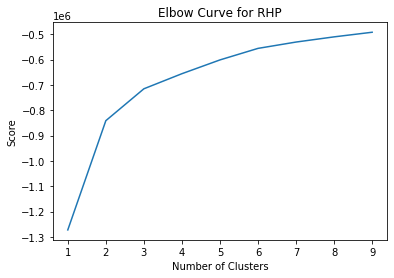

In [24]:
fig, ax = plt.subplots()
plt.plot(num_cl, score)
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.title('Elbow Curve for RHP')
plt.show()

In [25]:
fig.savefig('elbow.png')

Looks like 3 clusters will be good!

#### Now, for LHP

In [22]:
# create a score that represents a rate of variation for each given cluster option

score = [kmeans[i].fit(df_lhp_scaled).score(df_lhp_scaled) for i in range(len(kmeans))]
score

[-546149.9999999999,
 -380378.9010746548,
 -310874.9178904057,
 -281322.18833901535,
 -254824.42508697312,
 -240928.5787595256,
 -230755.87070913045,
 -221575.64926343685,
 -214374.81419499332]

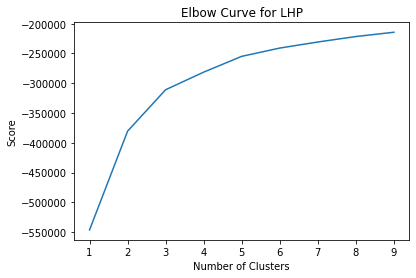

In [23]:
plt.plot(num_cl, score)
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.title('Elbow Curve for LHP')
plt.show()

Three clusters should also work for LHP

### 3.3 K-means clustering

In [24]:
kmeans = KMeans(n_clusters = 3) 

In [25]:
# for RHP

kmeans.fit(df_rhp_scaled)

KMeans(n_clusters=3)

In [26]:
df_rhp_scaled['clusters_rhp'] = kmeans.fit_predict(df_rhp_scaled)
df_rhp['clusters_rhp'] = kmeans.fit_predict(df_rhp_scaled)

In [27]:
# for LHP

kmeans.fit(df_lhp_scaled)

KMeans(n_clusters=3)

In [28]:
df_lhp_scaled['clusters_lhp'] = kmeans.fit_predict(df_lhp_scaled)
df_lhp['clusters_lhp'] = kmeans.fit_predict(df_lhp_scaled)

#### Merge with big df

In [29]:
df_rhp = df_rhp.reset_index().rename(columns={'index': 'id'})
df_rhp.head()

,id,release_speed,pfx_x,pfx_z,plate_x,plate_z,vx0,vy0,vz0,ax,ay,az,release_pos_x,release_pos_z,spin_axis,release_spin_rate,clusters_rhp
0,2,83.8,-1.52,0.16,-0.03,2.59,6.335426,-121.872042,-0.011538,-16.403257,26.798484,-30.857113,-1.49,5.27,261.0,1757.0,0
1,3,83.8,1.00,-1.11,0.01,1.71,0.508633,-121.963867,-0.025583,9.794691,27.581888,-43.382273,-1.07,5.49,35.0,2721.0,2
2,4,89.4,-0.74,1.73,0.70,2.61,9.685815,-129.689824,-6.336321,-10.374358,27.131450,-11.439196,-2.60,6.15,207.0,2493.0,1
3,7,84.9,0.51,-0.07,-0.23,2.34,2.545464,-123.678281,-1.606433,4.743260,23.350517,-32.749184,-1.75,5.76,83.0,2796.0,2
4,9,82.4,0.28,0.31,-0.06,1.51,5.847658,-120.006347,-4.363477,1.692362,20.947866,-28.579466,-2.87,6.00,184.0,2557.0,2


In [30]:
df_lhp = df_lhp.reset_index().rename(columns={'index': 'id'})
df_lhp.head()

,id,release_speed,pfx_x,pfx_z,plate_x,plate_z,vx0,vy0,vz0,ax,ay,az,release_pos_x,release_pos_z,spin_axis,release_spin_rate,clusters_lhp
0,0,82.7,0.20,0.58,-0.80,2.28,-9.320309,-120.130265,-0.463358,3.730978,23.623327,-26.715078,3.07,4.86,151.0,2272.0,0
1,1,82.4,-0.31,0.70,-0.26,1.83,-7.072452,-119.826649,-1.587563,-1.639002,23.311028,-25.370558,3.09,4.80,178.0,2356.0,1
2,5,80.3,1.09,0.34,0.11,1.85,-5.980313,-116.773704,-3.564373,11.095672,22.525168,-28.560923,1.88,6.20,137.0,1836.0,0
3,6,82.7,-0.15,0.60,-0.88,2.01,-8.871268,-120.266230,-1.316870,0.168832,22.522652,-26.250798,3.10,4.91,163.0,2237.0,1
4,8,96.1,0.86,1.28,-0.04,2.68,-7.844300,-139.659817,-6.061082,13.017878,31.376959,-14.188912,2.18,5.98,144.0,2282.0,2


In [31]:
df_merge1 = df.merge(df_rhp[['id','clusters_rhp']], on='id', how='left')
df_merge1.head()

,id,pitch_type,game_date,release_speed,release_pos_x,release_pos_z,player_name,batter,pitcher,events,...,park_surface,home_team_name,batter_team,batter_home_away,contact,runner_1b,runner_2b,runner_3b,scoring_play,clusters_rhp
0,0,FC,2021-04-30,82.7,3.07,4.86,"Altuve, Jose",514888,642232,field_out,...,Artificial turf,Tampa Bay Rays,HOU,away,Under,NaN,NaN,NaN,False,NaN
1,1,FC,2021-04-30,82.4,3.09,4.80,"Maldonado, Martín",455117,642232,field_out,...,Artificial turf,Tampa Bay Rays,HOU,away,Flare/Burner,NaN,NaN,NaN,False,NaN
2,2,CH,2021-04-30,83.8,-1.49,5.27,"Kiermaier, Kevin",595281,621121,field_out,...,Artificial turf,Tampa Bay Rays,TB,home,Under,NaN,NaN,NaN,False,0.0
3,3,KC,2021-04-30,83.8,-1.07,5.49,"Madrigal, Nick",663611,669456,field_out,...,Grass,Chicago White Sox,CWS,home,Topped,1.0,NaN,NaN,False,2.0
4,4,FF,2021-04-30,89.4,-2.60,6.15,"Reynolds, Bryan",668804,607231,field_out,...,Grass,Pittsburgh Pirates,PIT,home,Under,NaN,1.0,NaN,False,1.0


In [32]:
df_merge2 = df_merge1.merge(df_lhp[['id','clusters_lhp']], on='id', how='left')
df_merge2.head()

,id,pitch_type,game_date,release_speed,release_pos_x,release_pos_z,player_name,batter,pitcher,events,...,home_team_name,batter_team,batter_home_away,contact,runner_1b,runner_2b,runner_3b,scoring_play,clusters_rhp,clusters_lhp
0,0,FC,2021-04-30,82.7,3.07,4.86,"Altuve, Jose",514888,642232,field_out,...,Tampa Bay Rays,HOU,away,Under,NaN,NaN,NaN,False,NaN,0.0
1,1,FC,2021-04-30,82.4,3.09,4.80,"Maldonado, Martín",455117,642232,field_out,...,Tampa Bay Rays,HOU,away,Flare/Burner,NaN,NaN,NaN,False,NaN,1.0
2,2,CH,2021-04-30,83.8,-1.49,5.27,"Kiermaier, Kevin",595281,621121,field_out,...,Tampa Bay Rays,TB,home,Under,NaN,NaN,NaN,False,0.0,NaN
3,3,KC,2021-04-30,83.8,-1.07,5.49,"Madrigal, Nick",663611,669456,field_out,...,Chicago White Sox,CWS,home,Topped,1.0,NaN,NaN,False,2.0,NaN
4,4,FF,2021-04-30,89.4,-2.60,6.15,"Reynolds, Bryan",668804,607231,field_out,...,Pittsburgh Pirates,PIT,home,Under,NaN,1.0,NaN,False,1.0,NaN


## 4. Downcast data

In [33]:
df_merge2.info(verbose=False)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 121707 entries, 0 to 121706
Columns: 57 entries, id to clusters_lhp
dtypes: bool(1), float64(26), int64(10), object(20)
memory usage: 53.0+ MB


In [34]:
d = df_merge2

In [35]:
d['release_speed'] = d['release_speed'].astype('float32')
d['release_pos_x'] = d['release_pos_x'].astype('float32')
d['release_pos_z'] = d['release_pos_z'].astype('float32')

In [36]:
d['pfx_x'] = d['pfx_x'].astype('float32')
d['pfx_z'] = d['pfx_z'].astype('float32')
d['plate_x'] = d['plate_x'].astype('float32')
d['plate_z'] = d['plate_z'].astype('float32')

In [37]:
d['vx0'] = d['vx0'].astype('float32')
d['vy0'] = d['vy0'].astype('float32')
d['vz0'] = d['vz0'].astype('float32')

In [38]:
d['ax'] = d['ax'].astype('float32')
d['ay'] = d['ay'].astype('float32')
d['az'] = d['az'].astype('float32')

In [39]:
d['hit_distance_sc'] = d['hit_distance_sc'].astype('float32')
d['launch_angle'] = d['launch_angle'].astype('float32')
d['launch_speed'] = d['launch_speed'].astype('float32')
d['release_spin_rate'] = d['release_spin_rate'].astype('float32')

In [40]:
d['bat_score'] = d['bat_score'].astype('int8')
d['fld_score'] = d['fld_score'].astype('int8')
d['post_bat_score'] = d['post_bat_score'].astype('int8')

In [41]:
d['runner_1b'] = d['runner_1b'].astype('float32')
d['runner_2b'] = d['runner_2b'].astype('float32')
d['runner_3b'] = d['runner_3b'].astype('float32')

In [42]:
d['id'] = d['id'].astype('int32')
d['pitcher'] = d['pitcher'].astype('int32')
d['batter'] = d['batter'].astype('int32')
d['zone'] = d['zone'].astype('float32')
d['hit_location'] = d['hit_location'].astype('float32')

In [43]:
d['spin_axis'] = d['spin_axis'].astype('float32')
d['inning'] = d['inning'].astype('int8')
d['clusters_lhp'] = d['clusters_lhp'].astype('float32')
d['clusters_rhp'] = d['clusters_rhp'].astype('float32')

In [44]:
d.drop(columns=['launch_speed_angle', 'game_pk', 'at_bat_number', 'pitch_number'], inplace=True)

In [45]:
d.info(verbose=False)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 121707 entries, 0 to 121706
Columns: 53 entries, id to clusters_lhp
dtypes: bool(1), float32(25), int32(3), int8(4), object(20)
memory usage: 33.1+ MB


## 5. Correlation heatmaps

In [50]:
# I want to look at what attributes are most similar within each cluster by using a correlation heatmap
# subset the df using the appropriate clusters and separating RHP and LHP

rhp_cluster_0 = d[p_cols].loc[d['clusters_rhp'] == 0.0]
rhp_cluster_1 = d[p_cols].loc[d['clusters_rhp'] == 1.0]
rhp_cluster_2 = d[p_cols].loc[d['clusters_rhp'] == 2.0]

lhp_cluster_0 = d[p_cols].loc[d['clusters_lhp'] == 0.0]
lhp_cluster_1 = d[p_cols].loc[d['clusters_lhp'] == 1.0]
lhp_cluster_2 = d[p_cols].loc[d['clusters_lhp'] == 2.0]

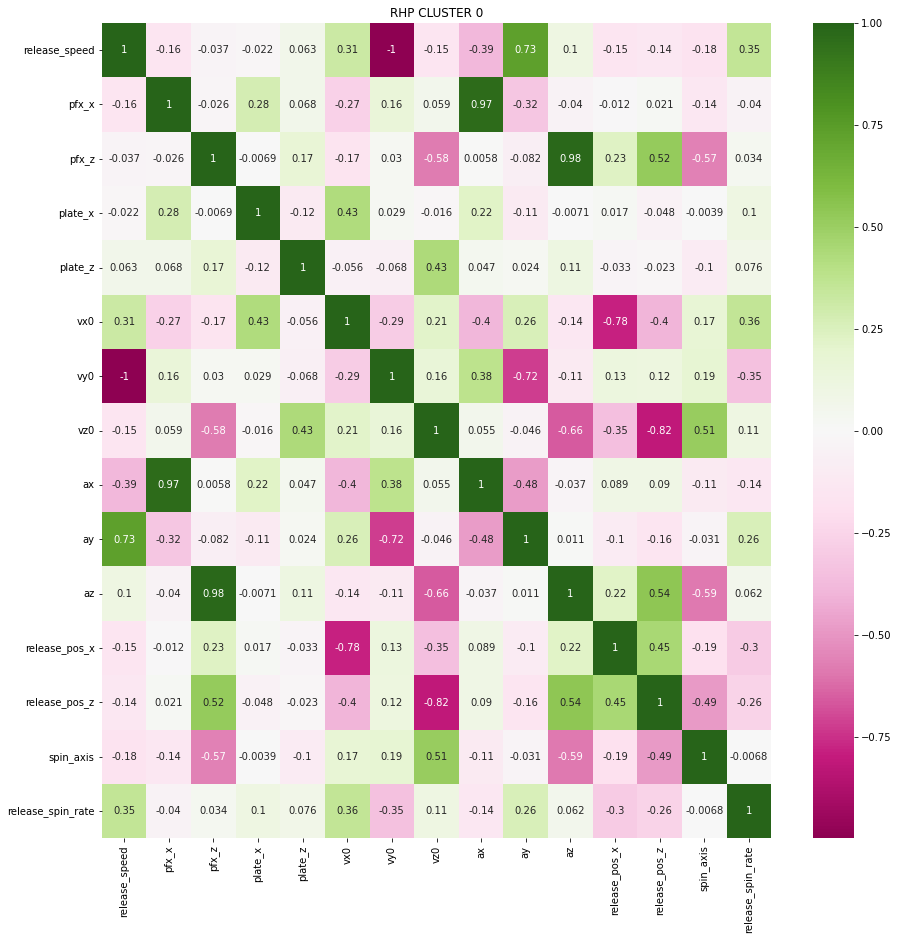

In [55]:
# FOR RHP, CLUSTER 0

# create a subplot that is pretty big because there are a lot of variables to compare
fig, ax = plt.subplots(figsize=(15,15))

# create a heatmap using seaborn
# Annotate the heatmap and use a fun color scale that indicates
# the strength of the correlation with the deepness of hue.
sns.heatmap(rhp_cluster_0.corr(), annot = True, cmap='PiYG')
plt.title('RHP CLUSTER 0')
plt.show()

fig.savefig('rhp_cluster0.png')

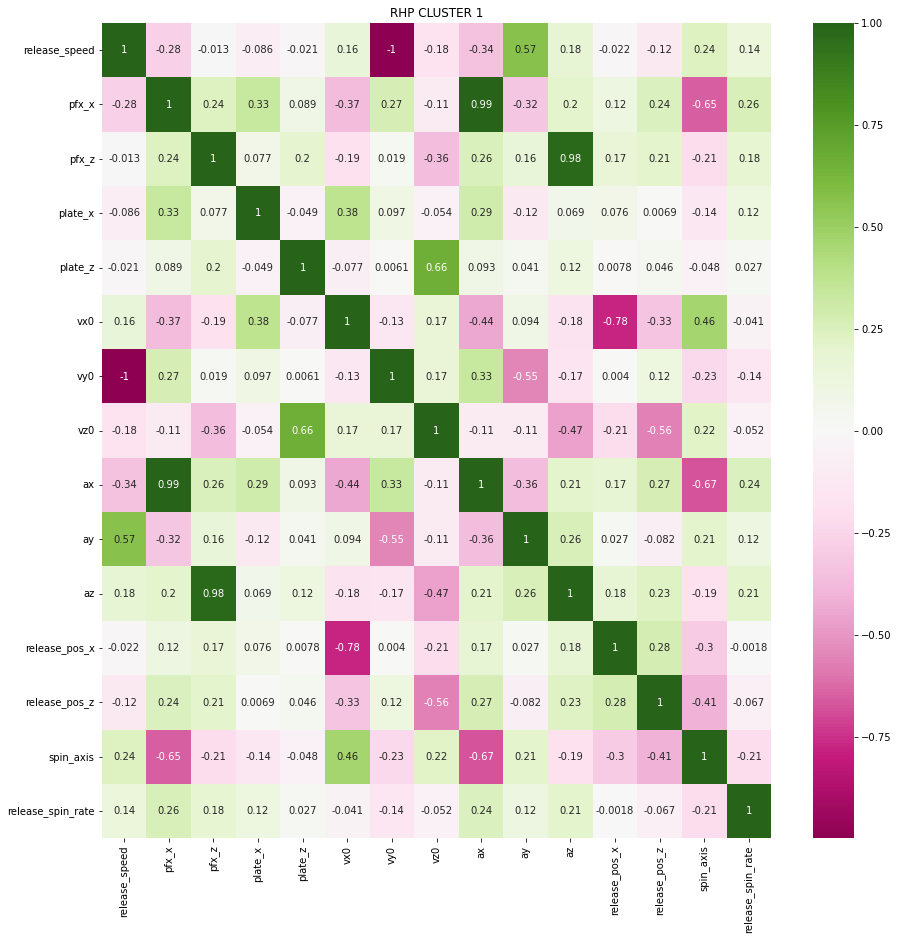

In [57]:
# FOR RHP, CLUSTER 1

# create a subplot that is pretty big because there are a lot of variables to compare
fig, ax = plt.subplots(figsize=(15,15))

# create a heatmap using seaborn
# Annotate the heatmap and use a fun color scale that indicates
# the strength of the correlation with the deepness of hue.
heatmap = sns.heatmap(rhp_cluster_1.corr(), annot = True, cmap='PiYG')
plt.title('RHP CLUSTER 1')
plt.show()

fig.savefig('rhp_cluster1.png')

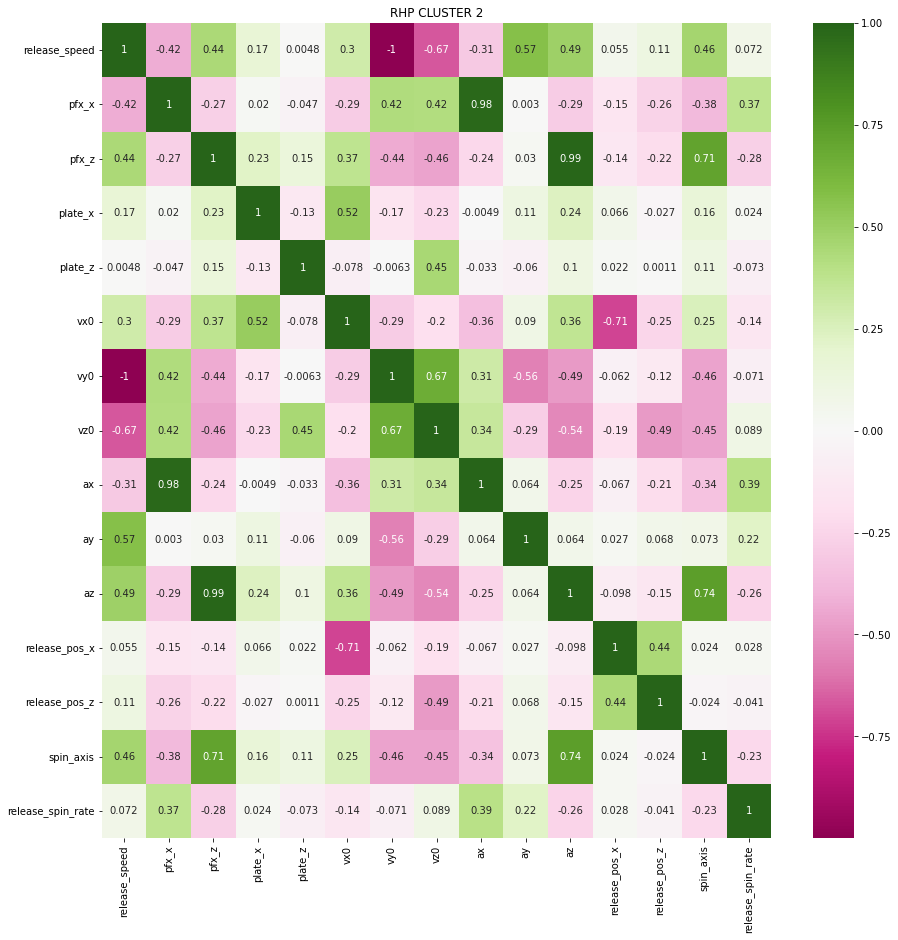

In [58]:
# FOR RHP, CLUSTER 2

# create a subplot that is pretty big because there are a lot of variables to compare
fig, ax = plt.subplots(figsize=(15,15))

# create a heatmap using seaborn
# Annotate the heatmap and use a fun color scale that indicates
# the strength of the correlation with the deepness of hue.
heatmap = sns.heatmap(rhp_cluster_2.corr(), annot = True, cmap='PiYG')
plt.title('RHP CLUSTER 2')
plt.show()

fig.savefig('rhp_cluster2.png')

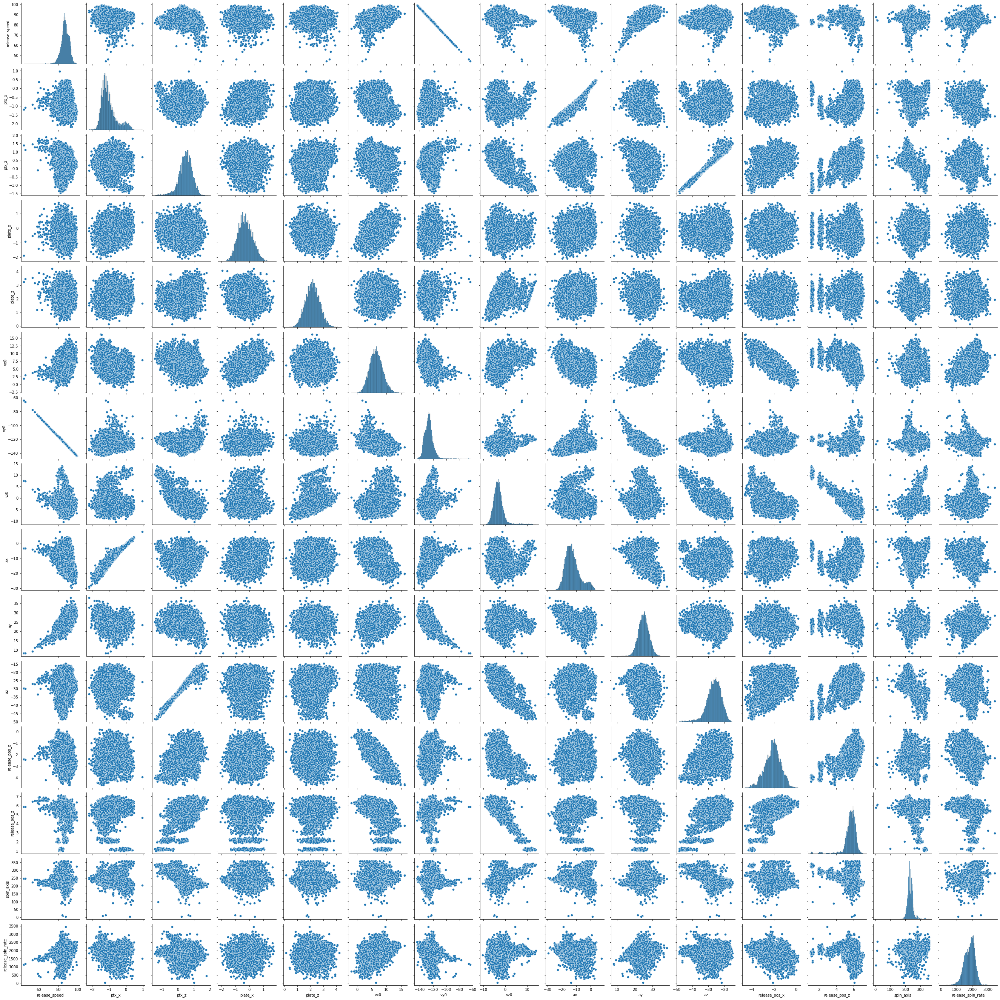

In [59]:
sns.pairplot(rhp_cluster_0)

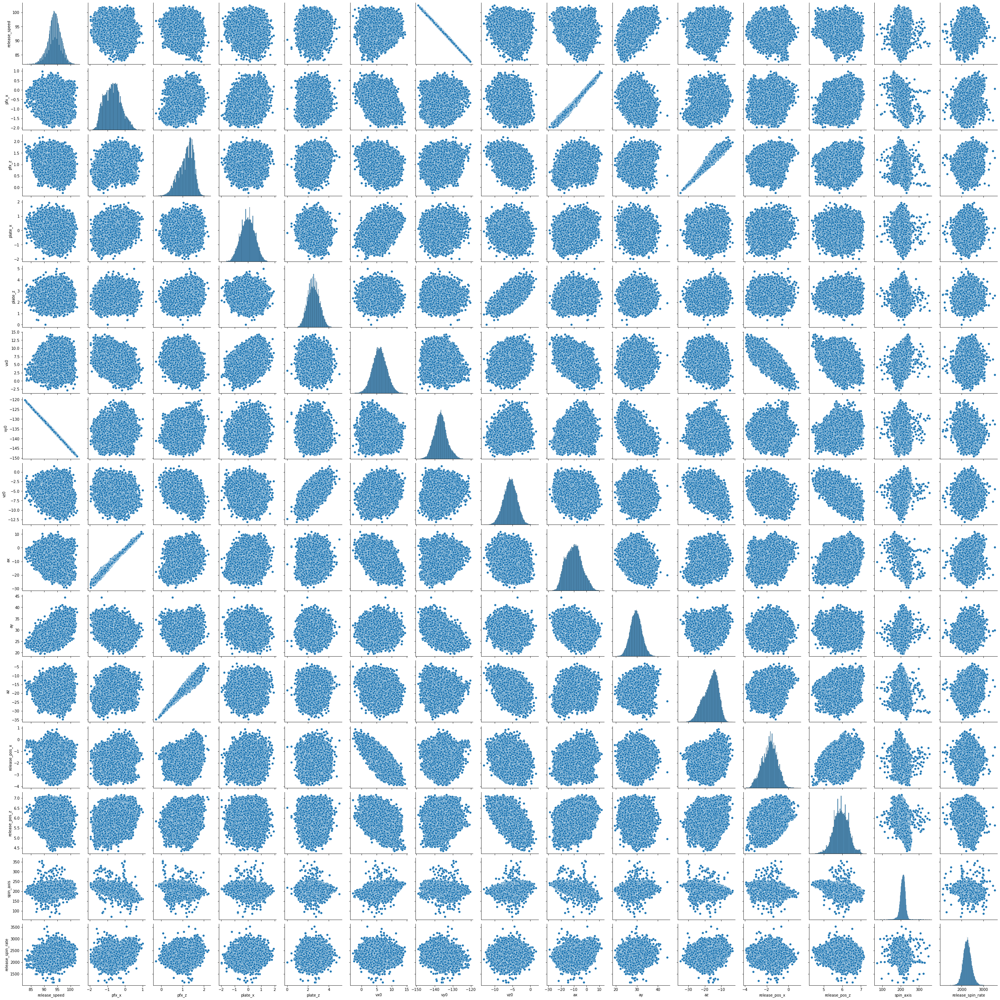

In [60]:
sns.pairplot(rhp_cluster_1)

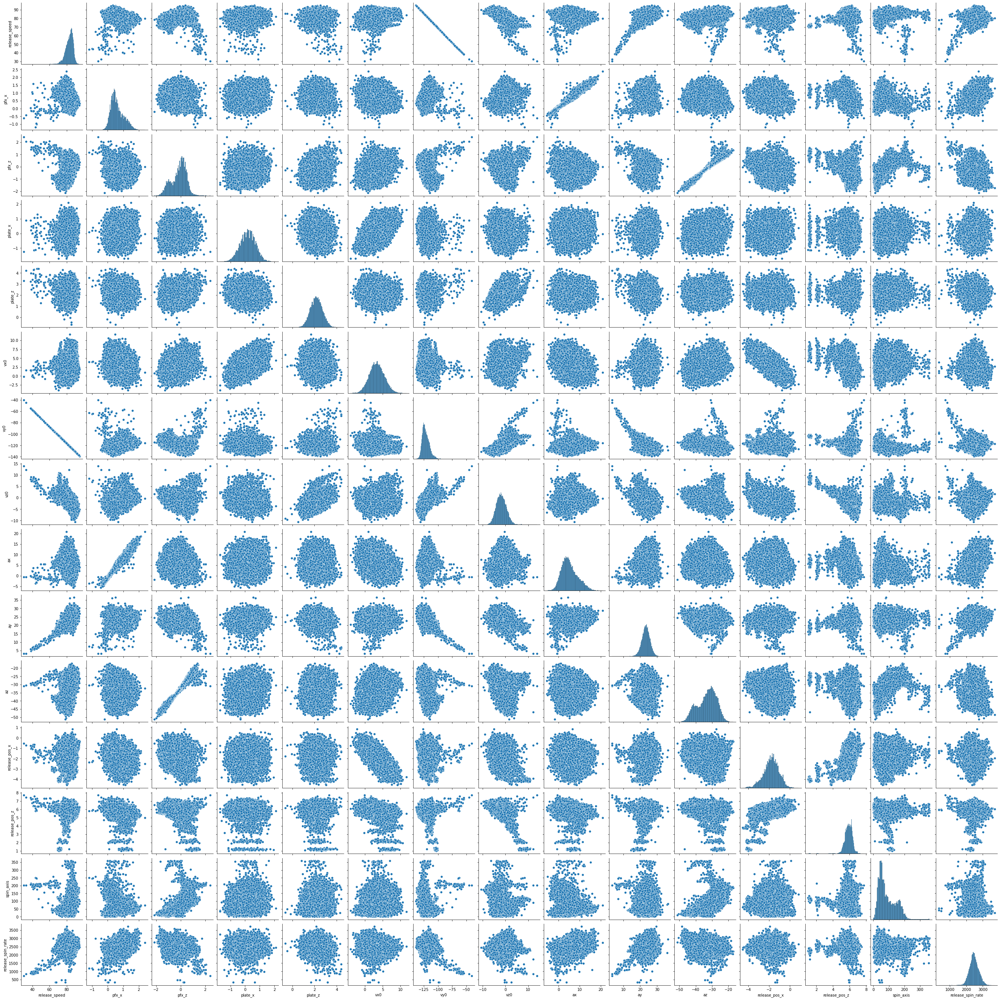

In [61]:
sns.pairplot(rhp_cluster_2)

In [78]:
data = {'rhp_cluster_0': rhp_cluster_0['spin_axis'].agg(['mean','median', 'std', 'min', 'max']),
        'rhp_cluster_1': rhp_cluster_1['spin_axis'].agg(['mean','median', 'std', 'min', 'max']),
        'rhp_cluster_2': rhp_cluster_2['spin_axis'].agg(['mean','median', 'std', 'min', 'max'])}

pd.DataFrame(data)

,rhp_cluster_0,rhp_cluster_1,rhp_cluster_2
mean,234.741257,211.104767,87.801437
median,233.000000,212.000000,70.000000
std,23.626635,13.857141,53.959095
min,4.000000,71.000000,0.000000
max,359.000000,356.000000,360.000000


In [77]:
data = {'rhp_cluster_0': rhp_cluster_0['release_speed'].agg(['mean','median', 'std', 'min', 'max']),
        'rhp_cluster_1': rhp_cluster_1['release_speed'].agg(['mean','median', 'std', 'min', 'max']),
        'rhp_cluster_2': rhp_cluster_2['release_speed'].agg(['mean','median', 'std', 'min', 'max'])}

pd.DataFrame(data)

,rhp_cluster_0,rhp_cluster_1,rhp_cluster_2
mean,87.008224,93.960213,83.171127
median,87.099998,94.000000,83.900002
std,4.191102,2.449960,4.606818
min,44.400002,82.699997,30.100000
max,99.000000,102.500000,95.199997


In [79]:
data = {'rhp_cluster_0': rhp_cluster_0['release_spin_rate'].agg(['mean','median', 'std', 'min', 'max']),
        'rhp_cluster_1': rhp_cluster_1['release_spin_rate'].agg(['mean','median', 'std', 'min', 'max']),
        'rhp_cluster_2': rhp_cluster_2['release_spin_rate'].agg(['mean','median', 'std', 'min', 'max'])}

pd.DataFrame(data)

,rhp_cluster_0,rhp_cluster_1,rhp_cluster_2
mean,1833.813232,2259.578857,2472.687988
median,1873.000000,2255.000000,2464.000000
std,337.720337,190.266510,287.583130
min,43.000000,1130.000000,328.000000
max,3448.000000,3523.000000,3722.000000


In [80]:
data = {'rhp_cluster_0': rhp_cluster_0['az'].agg(['mean','median', 'std', 'min', 'max']),
        'rhp_cluster_1': rhp_cluster_1['az'].agg(['mean','median', 'std', 'min', 'max']),
        'rhp_cluster_2': rhp_cluster_2['az'].agg(['mean','median', 'std', 'min', 'max'])}

pd.DataFrame(data)

,rhp_cluster_0,rhp_cluster_1,rhp_cluster_2
mean,-26.542265,-16.436485,-33.157242
median,-26.097334,-15.810154,-32.395493
std,4.787586,4.488116,5.738142
min,-48.386459,-34.753593,-51.271290
max,-14.801450,-3.089565,-17.080034


In [81]:
data = {'rhp_cluster_0': rhp_cluster_0['ax'].agg(['mean','median', 'std', 'min', 'max']),
        'rhp_cluster_1': rhp_cluster_1['ax'].agg(['mean','median', 'std', 'min', 'max']),
        'rhp_cluster_2': rhp_cluster_2['ax'].agg(['mean','median', 'std', 'min', 'max'])}

pd.DataFrame(data)

,rhp_cluster_0,rhp_cluster_1,rhp_cluster_2
mean,-12.494876,-10.114660,5.229939
median,-13.329418,-10.165712,4.705369
std,5.235269,6.225771,3.749838
min,-29.574150,-29.320499,-5.659145
max,7.522546,11.718801,20.828075


## 6. Save

In [46]:
d.to_csv(os.path.join(path, '02 data', 'prepared data', 'bip_final.csv'))